In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import warnings
import math
import itertools
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv('train_HJ.csv')
#df = df.set_index('Date')
df.head()

,Date,Year,Month,Day,Hour,PM10,PM2.5,Wind speed,Wind dir,Temp,Rel hum,index
0,2019-12-01 01:00,2019,12,1,100,16.0,4.0,0.4,89.0,22.7,96.0,1.354545
1,2019-12-01 02:00,2019,12,1,200,13.0,4.0,0.4,116.0,22.6,96.0,1.350000
2,2019-12-01 03:00,2019,12,1,300,16.0,3.0,0.3,69.0,22.5,96.0,1.366667
3,2019-12-01 04:00,2019,12,1,400,13.0,3.0,0.5,103.0,22.5,96.0,1.225000
4,2019-12-01 05:00,2019,12,1,500,11.0,2.0,0.3,129.0,22.5,96.0,1.883333


In [ ]:
df['Temp40'] = df['Temp'] // 40

In [ ]:
df['Hour'] = df['Hour'] / 10

In [ ]:
df.head()

,Date,Year,Month,Day,Hour,PM10,PM2.5,Wind speed,Wind dir,Temp,Rel hum,index,Temp40
0,2019-12-01 01:00,2019,12,1,10.0,16.0,4.0,0.4,89.0,22.7,96.0,1.354545,0.0
1,2019-12-01 02:00,2019,12,1,20.0,13.0,4.0,0.4,116.0,22.6,96.0,1.350000,0.0
2,2019-12-01 03:00,2019,12,1,30.0,16.0,3.0,0.3,69.0,22.5,96.0,1.366667,0.0
3,2019-12-01 04:00,2019,12,1,40.0,13.0,3.0,0.5,103.0,22.5,96.0,1.225000,0.0
4,2019-12-01 05:00,2019,12,1,50.0,11.0,2.0,0.3,129.0,22.5,96.0,1.883333,0.0


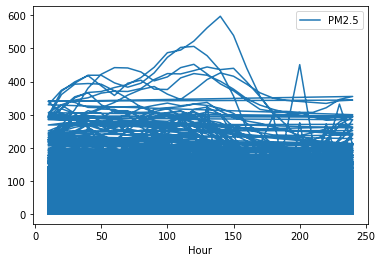

In [ ]:
df.plot(x='Hour', y='PM2.5')

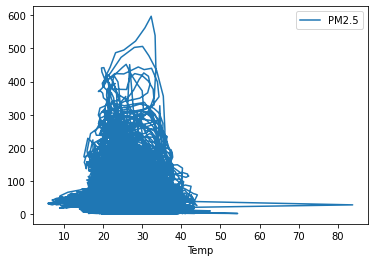

In [ ]:
df.plot(x='Temp', y='PM2.5')

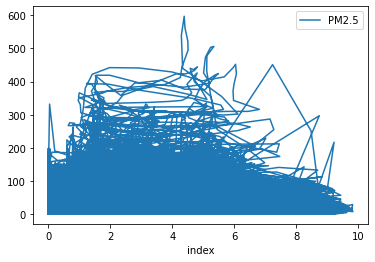

In [ ]:
df.plot(x='index', y='PM2.5')

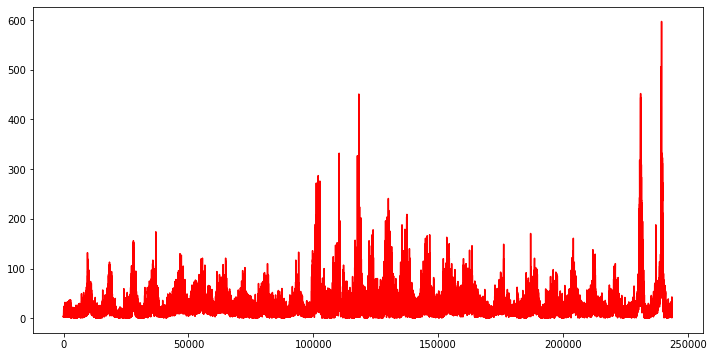

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
plt.plot(df['PM2.5'],'r')

In [ ]:
from sklearn import linear_model

x = df[['Year']]
y = df['PM2.5']

regr = linear_model.LinearRegression()
regr.fit(x, y)
a0 = regr.intercept_
a1 = regr.coef_
print(a0, a1)

1899.0644713031472 [-0.92844995]


In [ ]:
df['YrForecast'] = a0 + a1*df['Year']
df['PM2.5/Yr'] = df['PM2.5'] / df['YrForecast']
df.head()

,Date,Year,Month,Day,Hour,PM10,PM2.5,Wind speed,Wind dir,Temp,Rel hum,index,Temp40,YrForecast,PM2.5/Yr
0,2019-12-01 01:00,2019,12,1,10.0,16.0,4.0,0.4,89.0,22.7,96.0,1.354545,0.0,24.524023,0.163105
1,2019-12-01 02:00,2019,12,1,20.0,13.0,4.0,0.4,116.0,22.6,96.0,1.350000,0.0,24.524023,0.163105
2,2019-12-01 03:00,2019,12,1,30.0,16.0,3.0,0.3,69.0,22.5,96.0,1.366667,0.0,24.524023,0.122329
3,2019-12-01 04:00,2019,12,1,40.0,13.0,3.0,0.5,103.0,22.5,96.0,1.225000,0.0,24.524023,0.122329
4,2019-12-01 05:00,2019,12,1,50.0,11.0,2.0,0.3,129.0,22.5,96.0,1.883333,0.0,24.524023,0.081553


In [ ]:
from sklearn import linear_model

x1 = df[['Month']]
y1 = df['PM2.5/Yr']

regr = linear_model.LinearRegression()
regr.fit(x1, y1)
b0 = regr.intercept_
b1 = regr.coef_
print(b0, b1)

1.3264339028048946 [-0.05080388]


In [ ]:
df['MForecast'] = b0 + b1*df['Month']
df['PM2.5/M'] = df['PM2.5'] / df['MForecast']
df.head()

,Date,Year,Month,Day,Hour,PM10,PM2.5,Wind speed,Wind dir,Temp,Rel hum,index,Temp40,YrForecast,PM2.5/Yr,MForecast,PM2.5/M
0,2019-12-01 01:00,2019,12,1,10.0,16.0,4.0,0.4,89.0,22.7,96.0,1.354545,0.0,24.524023,0.163105,0.716787,5.580456
1,2019-12-01 02:00,2019,12,1,20.0,13.0,4.0,0.4,116.0,22.6,96.0,1.350000,0.0,24.524023,0.163105,0.716787,5.580456
2,2019-12-01 03:00,2019,12,1,30.0,16.0,3.0,0.3,69.0,22.5,96.0,1.366667,0.0,24.524023,0.122329,0.716787,4.185342
3,2019-12-01 04:00,2019,12,1,40.0,13.0,3.0,0.5,103.0,22.5,96.0,1.225000,0.0,24.524023,0.122329,0.716787,4.185342
4,2019-12-01 05:00,2019,12,1,50.0,11.0,2.0,0.3,129.0,22.5,96.0,1.883333,0.0,24.524023,0.081553,0.716787,2.790228


In [ ]:
from sklearn import linear_model

X = df[['Hour', 'PM10', 'Wind speed', 'Wind dir', 'Temp', 'Rel hum', 'index', 'Temp40']]
Y = df['PM2.5/M']

regr = linear_model.LinearRegression()
regr.fit(X, Y)
c0 = regr.intercept_
c1 = regr.coef_[0]
c2 = regr.coef_[1]
c3 = regr.coef_[2]
c4 = regr.coef_[3]
c5 = regr.coef_[4]
c6 = regr.coef_[5]
c7 = regr.coef_[6]
c8 = regr.coef_[7]
print(c0, c1, c2, c3, c4, c5, c6, c7, c8)

20.437409965348824 -0.007932379515054476 0.6000160281647597 -0.5166667678529522 -0.004644518158401889 -0.494973892243922 -0.07766773410748254 -0.44488973350359173 0.587705582596042


In [ ]:
df['PM2.5f'] = c0 + c1*df['Hour'] + c2*df['PM10'] + c3*df['Wind speed'] + c4*df['Wind dir'] + c5*df['Temp'] + c6*df['Rel hum'] + c7*df['index']  + c8*df['Temp40']  

df.head()

,Date,Year,Month,Day,Hour,PM10,PM2.5,Wind speed,Wind dir,Temp,Rel hum,index,Temp40,YrForecast,PM2.5/Yr,MForecast,PM2.5/M,PM2.5f
0,2019-12-01 01:00,2019,12,1,10.0,16.0,4.0,0.4,89.0,22.7,96.0,1.354545,0.0,24.524023,0.163105,0.716787,5.580456,10.043681
1,2019-12-01 02:00,2019,12,1,20.0,13.0,4.0,0.4,116.0,22.6,96.0,1.350000,0.0,24.524023,0.163105,0.716787,5.580456,8.090426
2,2019-12-01 03:00,2019,12,1,30.0,16.0,3.0,0.3,69.0,22.5,96.0,1.366667,0.0,24.524023,0.122329,0.716787,4.185342,10.123192
3,2019-12-01 04:00,2019,12,1,40.0,13.0,3.0,0.5,103.0,22.5,96.0,1.225000,0.0,24.524023,0.122329,0.716787,4.185342,8.045599
4,2019-12-01 05:00,2019,12,1,50.0,11.0,2.0,0.3,129.0,22.5,96.0,1.883333,0.0,24.524023,0.081553,0.716787,2.790228,6.455934


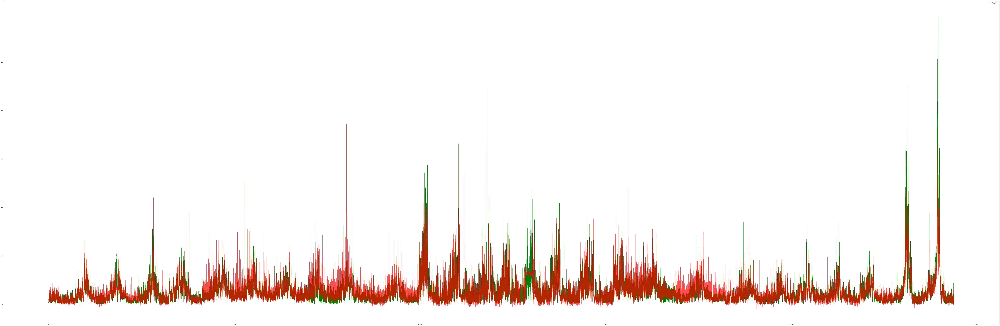

In [ ]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(180, 60), dpi=80, facecolor='w', edgecolor='k')
plt.plot(df['PM2.5'], color='g',label='ground truth')
plt.plot(df['PM2.5f'], alpha=.7, color='r',label='predict')
plt.legend(loc="upper right")
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

sqrt(mean_squared_error(df['PM2.5'], df['PM2.5f']))


11.51344694990884

In [ ]:
df2018 = df[df['Year'] == 2018]
df2018 = df2018.reset_index()
from matplotlib.pyplot import figure


print(sqrt(mean_squared_error(df2018['PM2.5'], df2018['PM2.5f'])))

figure(num=None, figsize=(300, 100), dpi=80, facecolor='w', edgecolor='k')
plt.plot(df2018['PM2.5'], color='g',label='ground truth')
plt.plot(df2018['PM2.5f'], alpha=.7, color='r',label='predict')
plt.legend(loc="upper right")
plt.show()

11.364684680695143


In [ ]:
df2020 = df[df['Year'] == 2020]
df2020 = df2020.reset_index()
from matplotlib.pyplot import figure


print(sqrt(mean_squared_error(df2020['PM2.5'], df2020['PM2.5f'])))

figure(num=None, figsize=(300, 100), dpi=80, facecolor='w', edgecolor='k')
plt.plot(df2020['PM2.5'], color='g',label='ground truth')
plt.plot(df2020['PM2.5f'], alpha=.7, color='r',label='predict')
plt.legend(loc="upper right")
plt.show()

11.9917982425768
